In [102]:
import pandas as pd
from pandas import *
import matplotlib.pyplot as plt 
import numpy as np
import pdvega 

In [103]:
df = pd.DataFrame({'column','1':['hello','how','are','you']})
df

SyntaxError: invalid syntax (<ipython-input-103-6630e4a77267>, line 1)

In [104]:
Gdata= 'Gdata.csv'
Gdf=pd.read_csv(Gdata)

In [105]:
def Cal_SNR(row):
    return (.26e-10)*row['stellar_mass']**(.72)+1.23e-3*row['spheroidStarFormationRate']**(.95)



In [106]:
Gdf.apply(Cal_SNR, axis=1)

0         3.387136e-06
1         5.958551e-04
2         2.091943e-04
3         3.272261e-06
4         9.370939e-06
5         3.290798e-06
6         5.655488e-05
7         5.751034e-03
8         2.485549e-04
9         2.501140e-05
10        2.701944e-06
11        2.311295e-06
12        1.829842e-05
13        8.420413e-06
14        5.983657e-07
15        2.591159e-06
16        1.593908e-05
17        1.481595e-05
18        4.003698e-05
19        1.016683e-05
20        5.989238e-05
21        4.233784e-05
22        1.431148e-06
23        6.374724e-06
24        4.631679e-04
25        4.557093e-06
26        2.393488e-05
27        1.076866e-05
28        1.673151e-06
29        4.742176e-06
              ...     
117137    3.757817e-06
117138    9.154816e+02
117139    1.559219e-05
117140    8.124454e-06
117141    3.889804e-06
117142    1.248511e-05
117143    1.617240e-05
117144    2.586541e-06
117145    1.232027e-06
117146    1.231388e-06
117147    2.360848e-06
117148    1.459866e-06
117149    8

In [107]:
Gdf1=Gdf['SNR']=Gdf.apply(Cal_SNR, axis=1)

In [122]:
Gdf=Gdf.drop(columns=['Unnamed: 0'])

In [167]:
Gdf=Gdf.sort_values(by=['SNR'])
Gdf


,galaxy_id,redshift,redshift_true,spheroidStarFormationRate,stellar_mass,SNR
2410,2410,0.055284,0.055305,0.000000e+00,5.508750e+05,3.536157e-07
61327,61327,0.164477,0.165545,0.000000e+00,5.738692e+05,3.641822e-07
4371,4371,0.073198,0.073129,0.000000e+00,6.306726e+05,3.897914e-07
11219,11219,0.092922,0.093980,0.000000e+00,6.308071e+05,3.898512e-07
11360,11360,0.094050,0.093623,0.000000e+00,6.474124e+05,3.972132e-07
4268,4268,0.070994,0.071708,0.000000e+00,6.502079e+05,3.984474e-07
13467,13467,0.099773,0.101211,0.000000e+00,6.599929e+05,4.027556e-07
115915,121251,0.198321,0.199742,0.000000e+00,6.670449e+05,4.058495e-07
2454,2454,0.057506,0.057746,0.000000e+00,6.795038e+05,4.112932e-07
62557,62557,0.154326,0.156069,0.000000e+00,7.000803e+05,4.202230e-07


In [168]:
Gdf1 = Gdf.filter(['spheroidStarFormationRate','stellar_mass','SNR'], axis=1)

In [169]:

#The galexies with large unusally large SNR have very larger SpherStarFormationRate like e+6


In [170]:
Gdf2=Gdf1.sort_values(by=['spheroidStarFormationRate'])
#The galexies with large unusally large SNR have very larger SpherStarFormationRate like e+6
Gdf2

,spheroidStarFormationRate,stellar_mass,SNR
2410,0.000000e+00,5.508750e+05,3.536157e-07
19395,0.000000e+00,7.824838e+07,1.253937e-05
98623,0.000000e+00,7.823906e+07,1.253829e-05
55880,0.000000e+00,7.823760e+07,1.253812e-05
12314,0.000000e+00,7.823726e+07,1.253808e-05
32291,0.000000e+00,7.823457e+07,1.253777e-05
53923,0.000000e+00,7.822812e+07,1.253703e-05
63743,0.000000e+00,7.822812e+07,1.253703e-05
43842,0.000000e+00,7.822178e+07,1.253630e-05
105580,0.000000e+00,7.821812e+07,1.253588e-05


In [171]:
SNR1=Gdf2.filter(['SNR'], axis=1)
SNR1=SNR1.sort_values(by=['SNR'])
SNR1



,SNR
2410,3.536157e-07
61327,3.641822e-07
4371,3.897914e-07
11219,3.898512e-07
11360,3.972132e-07
4268,3.984474e-07
13467,4.027556e-07
115915,4.058495e-07
2454,4.112932e-07
62557,4.202230e-07


In [172]:
SNRS=SNR1.T.squeeze()
#SNRS


In [173]:
#def add_them(SNRS):
    #cumsum=0
    #for elt in SNRS:
        #cumsum+= elt
        #yield cumsum

#SSRN= pd.DataFrame(add_them(SNRS))
SNRS2=np.cumsum(SNRS)

In [174]:
SNRS2

2410      3.536157e-07
61327     7.177979e-07
4371      1.107589e-06
11219     1.497440e-06
11360     1.894654e-06
4268      2.293101e-06
13467     2.695857e-06
115915    3.101706e-06
2454      3.512999e-06
62557     3.933222e-06
23018     4.356646e-06
39718     4.784770e-06
34092     5.214279e-06
112920    5.645841e-06
94846     6.077447e-06
23890     6.509462e-06
107895    6.944206e-06
78207     7.379074e-06
52524     7.816195e-06
53684     8.257076e-06
60364     8.697956e-06
52979     9.140502e-06
82320     9.591981e-06
96263     1.004356e-05
15437     1.049526e-05
26235     1.094772e-05
50892     1.140543e-05
45753     1.186313e-05
96654     1.232258e-05
114309    1.278350e-05
              ...     
9869      4.038153e+08
103609    4.068009e+08
97718     4.098143e+08
45799     4.128631e+08
55089     4.159828e+08
33967     4.192623e+08
24643     4.225418e+08
75439     4.258348e+08
88670     4.291591e+08
12001     4.325036e+08
57572     4.358850e+08
4448      4.393589e+08
80680     4

In [175]:
SNR_dist=pd.DataFrame({'SNR_dist':SNRS2/5.423174e+08})
SNR_dist

,SNR_dist
2410,6.520457e-16
61327,1.323575e-15
4371,2.042327e-15
11219,2.761188e-15
11360,3.493625e-15
4268,4.228337e-15
13467,4.970994e-15
115915,5.719356e-15
2454,6.477755e-15
62557,7.252620e-15


In [205]:
Gdf=Gdf.join(SNR_dist)

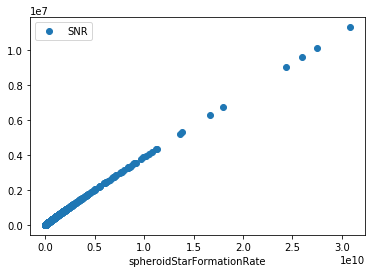

In [255]:
Gdf.plot( x='spheroidStarFormationRate', y='SNR', style='o')

In [101]:
#Gdf.vgplot(loglog=True, x='spheroidStarFormationRate', y='SNR')

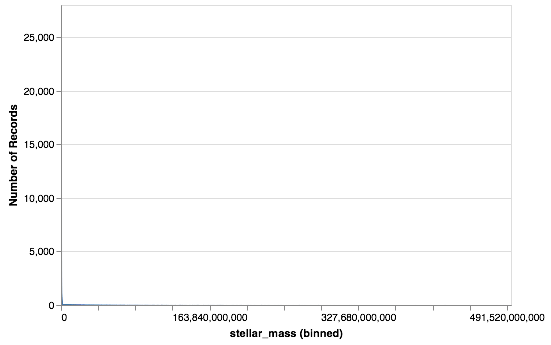

In [252]:
Gdf["stellar_mass"].vgplot.hist(bins=100000)

In [110]:
#Gdf.vgplot.scatter( x='spheroidStarFormationRate', y='SNR', s='stellar_mass', alpha=0.6, interactive=True)

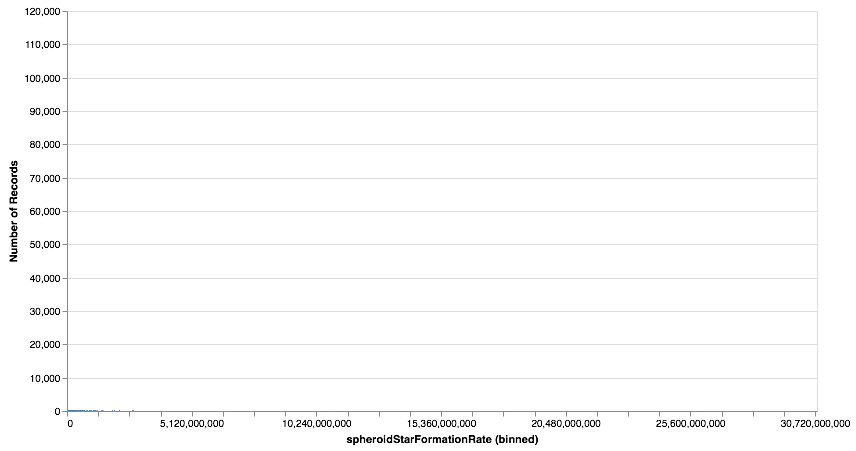

In [183]:
Gdf1["spheroidStarFormationRate"].vgplot.hist(bins=10000,width=750, height=400)

In [246]:
def Log_it(row):
    return np.log(row['spheroidStarFormationRate']+1)

In [248]:
lp['lp']=(Gdf.apply(Log_it, axis=1))
lp=lp.sort_values(by='lp')
lp.to_csv('lp.csv')
lp

,0,lp
2410,-inf,0.000000
13569,-inf,0.000000
36475,-inf,0.000000
15150,-inf,0.000000
46895,-inf,0.000000
19395,-inf,0.000000
98623,-inf,0.000000
55880,-inf,0.000000
12314,-inf,0.000000
32291,-inf,0.000000


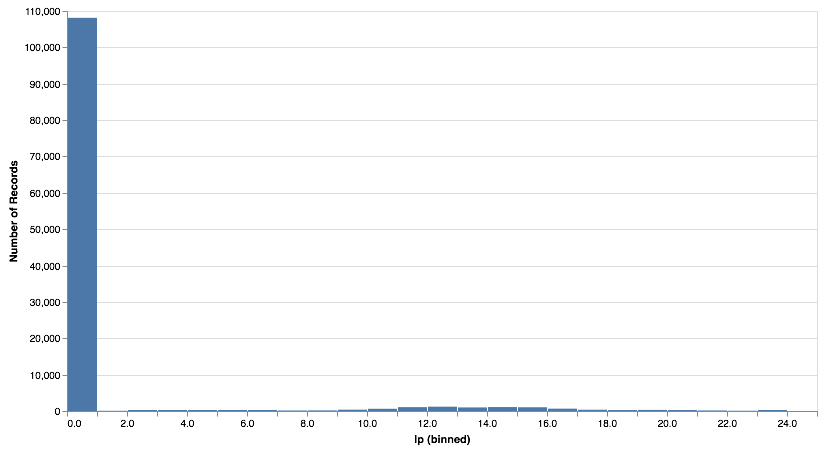

In [250]:
lp["lp"].vgplot.hist(bins=48,width=750, height=400)

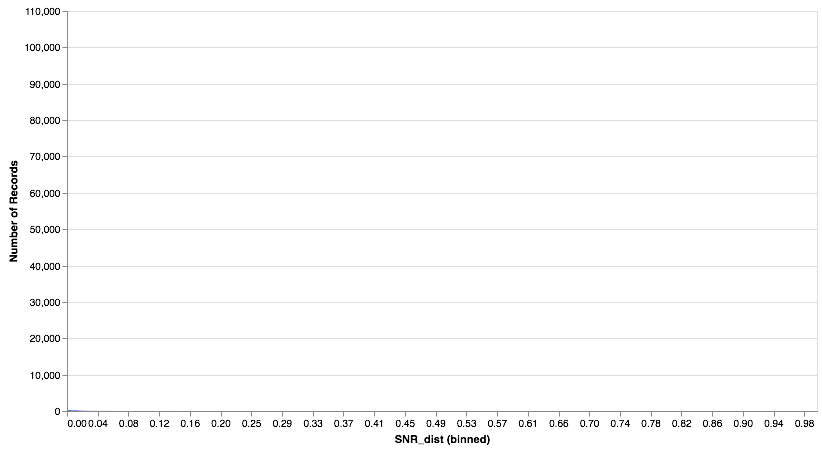

In [254]:
Gdf["SNR_dist"].vgplot.hist(bins=117167,width=750, height=400)